In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['font.family'] = 'NanumGothic'
import seaborn as sns

In [2]:
train=pd.read_csv('train.csv')
train.head()

,단지코드,총세대수,임대건물구분,지역,공급유형,전용면적,전용면적별세대수,공가수,자격유형,임대보증금,임대료,도보 10분거리 내 지하철역 수(환승노선 수 반영),도보 10분거리 내 버스정류장 수,단지내주차면수,등록차량수
0,C2483,900,아파트,경상북도,국민임대,39.72,134,38.0,A,15667000,103680,0.0,3.0,1425.0,1015.0
1,C2483,900,아파트,경상북도,국민임대,39.72,15,38.0,A,15667000,103680,0.0,3.0,1425.0,1015.0
2,C2483,900,아파트,경상북도,국민임대,51.93,385,38.0,A,27304000,184330,0.0,3.0,1425.0,1015.0
3,C2483,900,아파트,경상북도,국민임대,51.93,15,38.0,A,27304000,184330,0.0,3.0,1425.0,1015.0
4,C2483,900,아파트,경상북도,국민임대,51.93,41,38.0,A,27304000,184330,0.0,3.0,1425.0,1015.0


In [3]:
test=pd.read_csv('test.csv')
test.head()

,단지코드,총세대수,임대건물구분,지역,공급유형,전용면적,전용면적별세대수,공가수,자격유형,임대보증금,임대료,도보 10분거리 내 지하철역 수(환승노선 수 반영),도보 10분거리 내 버스정류장 수,단지내주차면수
0,C1072,754,아파트,경기도,국민임대,39.79,116,14.0,H,22830000,189840,0.0,2.0,683.0
1,C1072,754,아파트,경기도,국민임대,46.81,30,14.0,A,36048000,249930,0.0,2.0,683.0
2,C1072,754,아파트,경기도,국민임대,46.90,112,14.0,H,36048000,249930,0.0,2.0,683.0
3,C1072,754,아파트,경기도,국민임대,46.90,120,14.0,H,36048000,249930,0.0,2.0,683.0
4,C1072,754,아파트,경기도,국민임대,51.46,60,14.0,H,43497000,296780,0.0,2.0,683.0


In [4]:
test.groupby(test.지역).count()

,단지코드,총세대수,임대건물구분,공급유형,전용면적,전용면적별세대수,공가수,자격유형,임대보증금,임대료,도보 10분거리 내 지하철역 수(환승노선 수 반영),도보 10분거리 내 버스정류장 수,단지내주차면수
지역,,,,,,,,,,,,,
강원도,106,106,106,106,106,106,106,105,61,61,106,106,106
경기도,259,259,259,259,259,259,259,259,259,259,259,259,259
경상남도,85,85,85,85,85,85,85,84,85,85,85,85,85
경상북도,58,58,58,58,58,58,58,58,58,58,58,58,58
광주광역시,46,46,46,46,46,46,46,46,46,46,46,46,46
대구광역시,36,36,36,36,36,36,36,36,36,36,36,36,36
대전광역시,56,56,56,56,56,56,56,56,33,33,47,56,56
부산광역시,88,88,88,88,88,88,88,88,45,45,88,88,88
세종특별자치시,19,19,19,19,19,19,19,19,19,19,19,19,19


# 임대보증금과 임대료 '-'을 null로 바꾼 후 float로 타입 변경

In [5]:
train.loc[train.임대보증금=='-', '임대보증금'] = np.nan
test.loc[test.임대보증금=='-', '임대보증금'] = np.nan
train['임대보증금'] = train['임대보증금'].astype(float)
test['임대보증금'] = test['임대보증금'].astype(float)

train.loc[train.임대료=='-', '임대료'] = np.nan
test.loc[test.임대료=='-', '임대료'] = np.nan
train['임대료'] = train['임대료'].astype(float)
test['임대료'] = test['임대료'].astype(float)

In [6]:
print(train.shape)
print(test.shape)

(2952, 15)
(1022, 14)


In [7]:
train.isna().sum()

단지코드                              0
총세대수                              0
임대건물구분                            0
지역                                0
공급유형                              0
전용면적                              0
전용면적별세대수                          0
공가수                               0
자격유형                              0
임대보증금                           581
임대료                             590
도보 10분거리 내 지하철역 수(환승노선 수 반영)    211
도보 10분거리 내 버스정류장 수                4
단지내주차면수                           0
등록차량수                             0
dtype: int64

In [8]:
test.isna().sum()

단지코드                              0
총세대수                              0
임대건물구분                            0
지역                                0
공급유형                              0
전용면적                              0
전용면적별세대수                          0
공가수                               0
자격유형                              2
임대보증금                           186
임대료                             186
도보 10분거리 내 지하철역 수(환승노선 수 반영)     42
도보 10분거리 내 버스정류장 수                0
단지내주차면수                           0
dtype: int64

In [9]:
train[train.임대보증금.isnull()].공급유형.value_counts()

임대상가    562
국민임대      8
공공분양      7
행복주택      4
Name: 공급유형, dtype: int64

In [10]:
test[test.임대보증금.isnull()].공급유형.value_counts()

임대상가    177
영구임대      5
행복주택      4
Name: 공급유형, dtype: int64

In [11]:
train[train.임대보증금.isnull()].자격유형.value_counts()

D    569
H      8
K      4
Name: 자격유형, dtype: int64

In [12]:
test[test.임대보증금.isnull()].자격유형.value_counts()

D    180
L      4
C      2
Name: 자격유형, dtype: int64

In [13]:
train[['임대보증금', '임대료']] = train[['임대보증금', '임대료']].fillna(0)
test[['임대보증금', '임대료']] = test[['임대보증금', '임대료']].fillna(0)

## 도보 10분거리 내 지하철역 수(환승노선 수 반영), 도보 10분거리 내 버스정류장 수
- NULL 값을 0으로 대체

In [14]:
subway_null_codes = train[train['도보 10분거리 내 지하철역 수(환승노선 수 반영)'].isnull()].단지코드.unique()
train.loc[train.단지코드.isin(subway_null_codes), '도보 10분거리 내 지하철역 수(환승노선 수 반영)'].value_counts(dropna=False)

NaN    211
Name: 도보 10분거리 내 지하철역 수(환승노선 수 반영), dtype: int64

In [15]:
subway_null_codes = test[test['도보 10분거리 내 지하철역 수(환승노선 수 반영)'].isnull()].단지코드.unique()
test.loc[test.단지코드.isin(subway_null_codes), '도보 10분거리 내 지하철역 수(환승노선 수 반영)'].value_counts(dropna=False)

NaN    42
Name: 도보 10분거리 내 지하철역 수(환승노선 수 반영), dtype: int64

In [16]:
bus_null_codes = train[train['도보 10분거리 내 버스정류장 수'].isnull()].단지코드.unique()
train.loc[train.단지코드.isin(bus_null_codes), '도보 10분거리 내 버스정류장 수'].value_counts(dropna=False)

NaN    4
Name: 도보 10분거리 내 버스정류장 수, dtype: int64

In [17]:
cols = ['도보 10분거리 내 지하철역 수(환승노선 수 반영)', '도보 10분거리 내 버스정류장 수']
train[cols] = train[cols].fillna(0)
test[cols] = test[cols].fillna(0)

## 자격유형

In [18]:
train.isna().sum()

단지코드                            0
총세대수                            0
임대건물구분                          0
지역                              0
공급유형                            0
전용면적                            0
전용면적별세대수                        0
공가수                             0
자격유형                            0
임대보증금                           0
임대료                             0
도보 10분거리 내 지하철역 수(환승노선 수 반영)    0
도보 10분거리 내 버스정류장 수              0
단지내주차면수                         0
등록차량수                           0
dtype: int64

In [19]:
train.shape

(2952, 15)

### 자격유형은 test에만 na있음

In [20]:
test.isna().sum()

단지코드                            0
총세대수                            0
임대건물구분                          0
지역                              0
공급유형                            0
전용면적                            0
전용면적별세대수                        0
공가수                             0
자격유형                            2
임대보증금                           0
임대료                             0
도보 10분거리 내 지하철역 수(환승노선 수 반영)    0
도보 10분거리 내 버스정류장 수              0
단지내주차면수                         0
dtype: int64

In [21]:
test[test.자격유형.isnull()]

,단지코드,총세대수,임대건물구분,지역,공급유형,전용면적,전용면적별세대수,공가수,자격유형,임대보증금,임대료,도보 10분거리 내 지하철역 수(환승노선 수 반영),도보 10분거리 내 버스정류장 수,단지내주차면수
196,C2411,962,아파트,경상남도,국민임대,46.90,240,25.0,NaN,71950000.0,37470.0,0.0,2.0,840.0
258,C2253,1161,아파트,강원도,영구임대,26.37,745,0.0,NaN,2249000.0,44770.0,0.0,2.0,173.0


In [22]:
test[test.단지코드=='C2411']

,단지코드,총세대수,임대건물구분,지역,공급유형,전용면적,전용면적별세대수,공가수,자격유형,임대보증금,임대료,도보 10분거리 내 지하철역 수(환승노선 수 반영),도보 10분거리 내 버스정류장 수,단지내주차면수
193,C2411,962,아파트,경상남도,국민임대,39.43,56,25.0,A,11992000.0,100720.0,0.0,2.0,840.0
194,C2411,962,아파트,경상남도,국민임대,39.72,336,25.0,A,11992000.0,100720.0,0.0,2.0,840.0
195,C2411,962,아파트,경상남도,국민임대,39.82,179,25.0,A,11992000.0,100720.0,0.0,2.0,840.0
196,C2411,962,아파트,경상남도,국민임대,46.90,240,25.0,NaN,71950000.0,37470.0,0.0,2.0,840.0
197,C2411,962,아파트,경상남도,국민임대,51.93,150,25.0,A,21586000.0,171480.0,0.0,2.0,840.0


In [23]:
test[test.단지코드=='C2253']

,단지코드,총세대수,임대건물구분,지역,공급유형,전용면적,전용면적별세대수,공가수,자격유형,임대보증금,임대료,도보 10분거리 내 지하철역 수(환승노선 수 반영),도보 10분거리 내 버스정류장 수,단지내주차면수
258,C2253,1161,아파트,강원도,영구임대,26.37,745,0.0,NaN,2249000.0,44770.0,0.0,2.0,173.0
259,C2253,1161,아파트,강원도,영구임대,31.32,239,0.0,C,3731000.0,83020.0,0.0,2.0,173.0
260,C2253,1161,아파트,강원도,영구임대,31.32,149,0.0,C,3731000.0,83020.0,0.0,2.0,173.0
261,C2253,1161,상가,강원도,임대상가,13.77,1,0.0,D,0.0,0.0,0.0,2.0,173.0
262,C2253,1161,상가,강원도,임대상가,22.89,1,0.0,D,0.0,0.0,0.0,2.0,173.0
263,C2253,1161,상가,강원도,임대상가,22.91,1,0.0,D,0.0,0.0,0.0,2.0,173.0
264,C2253,1161,상가,강원도,임대상가,23.79,1,0.0,D,0.0,0.0,0.0,2.0,173.0
265,C2253,1161,상가,강원도,임대상가,23.79,1,0.0,D,0.0,0.0,0.0,2.0,173.0
266,C2253,1161,상가,강원도,임대상가,23.86,1,0.0,D,0.0,0.0,0.0,2.0,173.0
267,C2253,1161,상가,강원도,임대상가,23.86,1,0.0,D,0.0,0.0,0.0,2.0,173.0


In [24]:
test.loc[test.단지코드.isin(['C2411']) & test.자격유형.isnull(), '자격유형'] = 'A'
test.loc[test.단지코드.isin(['C2253']) & test.자격유형.isnull(), '자격유형'] = 'C'

# 중복데이터 처리

In [25]:
train[train.duplicated()]

,단지코드,총세대수,임대건물구분,지역,공급유형,전용면적,전용면적별세대수,공가수,자격유형,임대보증금,임대료,도보 10분거리 내 지하철역 수(환승노선 수 반영),도보 10분거리 내 버스정류장 수,단지내주차면수,등록차량수
21,C1407,1216,아파트,대전광역시,국민임대,41.58,70,13.0,A,27637000.0,164610.0,1.0,1.0,1285.0,1064.0
23,C1407,1216,아파트,대전광역시,국민임대,46.36,170,13.0,A,36048000.0,198250.0,1.0,1.0,1285.0,1064.0
25,C1407,1216,아파트,대전광역시,국민임대,51.24,62,13.0,A,42056000.0,253520.0,1.0,1.0,1285.0,1064.0
27,C1945,755,아파트,경기도,국민임대,39.72,120,6.0,B,15607000.0,130070.0,1.0,3.0,734.0,730.0
49,C1244,1722,아파트,경기도,국민임대,46.81,76,10.0,A,43990000.0,304540.0,0.0,10.0,1483.0,1804.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2745,C1803,100,아파트,울산광역시,행복주택,26.26,6,13.0,J,34400000.0,163680.0,0.0,2.0,57.0,78.0
2747,C1803,100,아파트,울산광역시,행복주택,36.16,8,13.0,J,46400000.0,220780.0,0.0,2.0,57.0,78.0
2749,C1803,100,아파트,울산광역시,행복주택,36.16,9,13.0,J,46400000.0,220780.0,0.0,2.0,57.0,78.0
2796,C2362,1509,아파트,경기도,행복주택,21.96,144,46.0,J,19760000.0,83000.0,0.0,2.0,1055.0,196.0


In [26]:
test[test.duplicated()]

,단지코드,총세대수,임대건물구분,지역,공급유형,전용면적,전용면적별세대수,공가수,자격유형,임대보증금,임대료,도보 10분거리 내 지하철역 수(환승노선 수 반영),도보 10분거리 내 버스정류장 수,단지내주차면수
23,C1456,619,아파트,부산광역시,국민임대,46.90,86,18.0,A,36048000.0,234300.0,0.0,16.0,547.0
77,C1006,1505,아파트,대전광역시,영구임대,26.37,10,27.0,D,0.0,0.0,2.0,5.0,428.0
81,C1006,1505,상가,대전광역시,임대상가,38.00,1,27.0,D,0.0,0.0,2.0,5.0,428.0
84,C1006,1505,상가,대전광역시,임대상가,37.41,1,27.0,D,0.0,0.0,2.0,5.0,428.0
85,C1006,1505,상가,대전광역시,임대상가,37.41,1,27.0,D,0.0,0.0,2.0,5.0,428.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
698,C2473,1147,아파트,광주광역시,국민임대,51.52,44,17.0,A,30734000.0,174930.0,0.0,1.0,1222.0
825,C2303,963,아파트,경기도,공공임대(10년),74.93,89,16.0,A,48900000.0,494000.0,0.0,6.0,1161.0
893,C1327,98,아파트,대전광역시,행복주택,26.51,10,13.0,J,28400000.0,142000.0,0.0,17.0,98.0
963,C2404,214,아파트,전라남도,행복주택,16.95,12,15.0,J,12480000.0,78000.0,0.0,5.0,117.0


In [27]:
train = train.drop_duplicates(keep="first")
test = test.drop_duplicates(keep="first")

In [28]:
print(train.shape)
print(test.shape)

(2632, 15)
(949, 14)


In [29]:
train.groupby(['단지코드']).nunique(dropna=False).sum(axis=0)

총세대수                             423
임대건물구분                           456
지역                               423
공급유형                             488
전용면적                            1898
전용면적별세대수                        2230
공가수                              423
자격유형                             510
임대보증금                           1277
임대료                             1289
도보 10분거리 내 지하철역 수(환승노선 수 반영)     423
도보 10분거리 내 버스정류장 수               423
단지내주차면수                          423
등록차량수                            423
dtype: int64

In [30]:
test.groupby(['단지코드']).nunique(dropna=False).sum(axis=0)

총세대수                            150
임대건물구분                          157
지역                              150
공급유형                            167
전용면적                            693
전용면적별세대수                        797
공가수                             150
자격유형                            178
임대보증금                           459
임대료                             461
도보 10분거리 내 지하철역 수(환승노선 수 반영)    150
도보 10분거리 내 버스정류장 수              150
단지내주차면수                         150
dtype: int64

# Age, Gender Information

In [31]:
ag=pd.read_csv('age_gender_info.csv')
ag.head()

,지역,10대미만(여자),10대미만(남자),10대(여자),10대(남자),20대(여자),20대(남자),30대(여자),30대(남자),40대(여자),...,60대(여자),60대(남자),70대(여자),70대(남자),80대(여자),80대(남자),90대(여자),90대(남자),100대(여자),100대(남자)
0,경상북도,0.030158,0.033195,0.056346,0.061360,0.060096,0.067859,0.053433,0.049572,0.083660,...,0.082684,0.063889,0.047717,0.030172,0.029361,0.011211,0.005578,0.001553,0.000234,0.000014
1,경상남도,0.027400,0.026902,0.053257,0.055568,0.064920,0.070618,0.056414,0.057550,0.077092,...,0.087201,0.069562,0.048357,0.033277,0.027361,0.011295,0.004910,0.001086,0.000179,0.000010
2,대전광역시,0.028197,0.029092,0.040490,0.042793,0.060834,0.064247,0.068654,0.066848,0.074667,...,0.088468,0.070261,0.051010,0.037143,0.032455,0.013751,0.006494,0.001740,0.000298,0.000066
3,경기도,0.038030,0.039507,0.052546,0.053990,0.058484,0.059894,0.072331,0.068704,0.083208,...,0.074237,0.058419,0.042422,0.032725,0.025136,0.012354,0.005390,0.001707,0.000290,0.000067
4,전라북도,0.028089,0.029065,0.059685,0.060080,0.066262,0.070322,0.052027,0.046596,0.077005,...,0.076636,0.068042,0.051025,0.035748,0.035049,0.012641,0.007223,0.001898,0.000158,0.000013


In [32]:
ag.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16 entries, 0 to 15
Data columns (total 23 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   지역         16 non-null     object 
 1   10대미만(여자)  16 non-null     float64
 2   10대미만(남자)  16 non-null     float64
 3   10대(여자)    16 non-null     float64
 4   10대(남자)    16 non-null     float64
 5   20대(여자)    16 non-null     float64
 6   20대(남자)    16 non-null     float64
 7   30대(여자)    16 non-null     float64
 8   30대(남자)    16 non-null     float64
 9   40대(여자)    16 non-null     float64
 10  40대(남자)    16 non-null     float64
 11  50대(여자)    16 non-null     float64
 12  50대(남자)    16 non-null     float64
 13  60대(여자)    16 non-null     float64
 14  60대(남자)    16 non-null     float64
 15  70대(여자)    16 non-null     float64
 16  70대(남자)    16 non-null     float64
 17  80대(여자)    16 non-null     float64
 18  80대(남자)    16 non-null     float64
 19  90대(여자)    16 non-null     float64
 20  90대(남자)    1

In [33]:
train=pd.merge(train, ag, on='지역', how='outer')

In [34]:
test=pd.merge(test, ag, on='지역', how='outer')

In [35]:
test[test.지역=="서울특별시"]

,단지코드,총세대수,임대건물구분,지역,공급유형,전용면적,전용면적별세대수,공가수,자격유형,임대보증금,...,60대(여자),60대(남자),70대(여자),70대(남자),80대(여자),80대(남자),90대(여자),90대(남자),100대(여자),100대(남자)
949,NaN,NaN,NaN,서울특별시,NaN,NaN,NaN,NaN,NaN,NaN,...,0.119639,0.078939,0.097543,0.06105,0.047853,0.023463,0.011344,0.003326,0.000532,0.000152


In [36]:
test=test.dropna()

# Visualization

In [37]:
import plotly 
import plotly.express as px

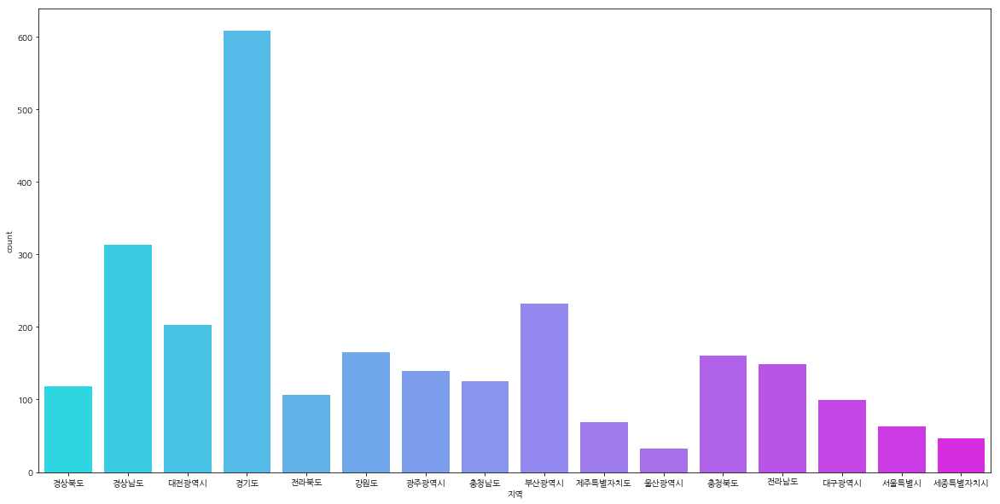

In [38]:
plt.subplots(figsize=(20,10))
sns.countplot(x=train["지역"],palette="cool")

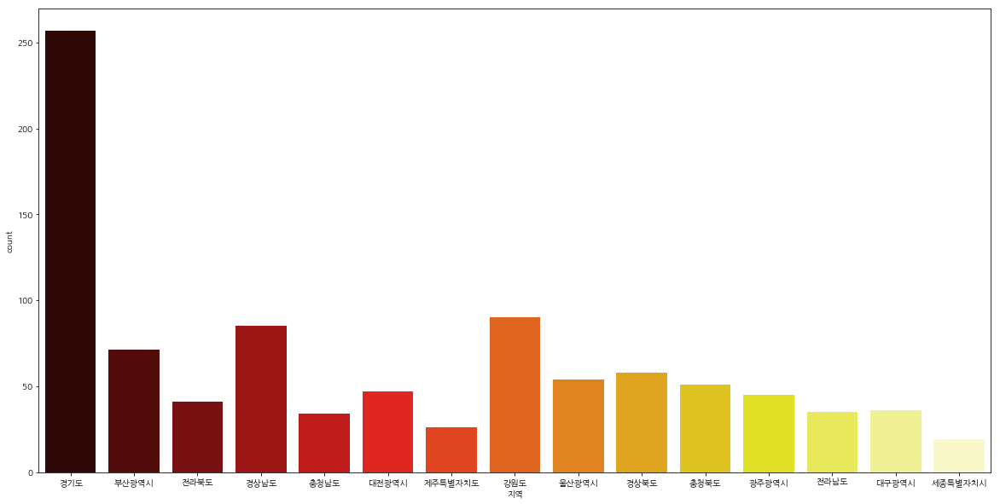

In [39]:
plt.subplots(figsize=(20,10))
sns.countplot(x=test["지역"],palette="hot")
# 서울 없당...

In [62]:
train.columns

Index(['단지코드', '총세대수', '임대건물구분', '지역', '공급유형', '전용면적', '전용면적별세대수', '공가수',
       '자격유형', '임대보증금', '임대료', '도보 10분거리 내 지하철역 수(환승노선 수 반영)',
       '도보 10분거리 내 버스정류장 수', '단지내주차면수', '등록차량수', '10대미만(여자)', '10대미만(남자)',
       '10대(여자)', '10대(남자)', '20대(여자)', '20대(남자)', '30대(여자)', '30대(남자)',
       '40대(여자)', '40대(남자)', '50대(여자)', '50대(남자)', '60대(여자)', '60대(남자)',
       '70대(여자)', '70대(남자)', '80대(여자)', '80대(남자)', '90대(여자)', '90대(남자)',
       '100대(여자)', '100대(남자)', '남자인구수', '여자인구수', '승용차수'],
      dtype='object')

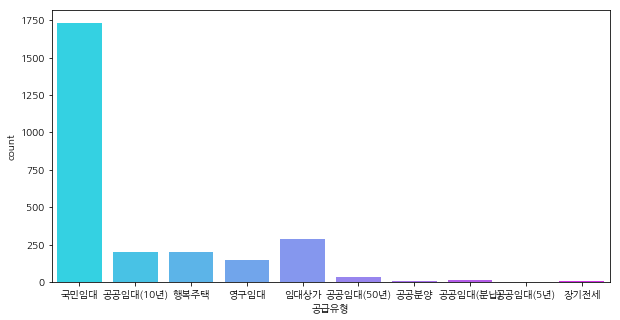

In [66]:
plt.subplots(figsize=(10,5))
sns.countplot(x=train["공급유형"],palette="cool")

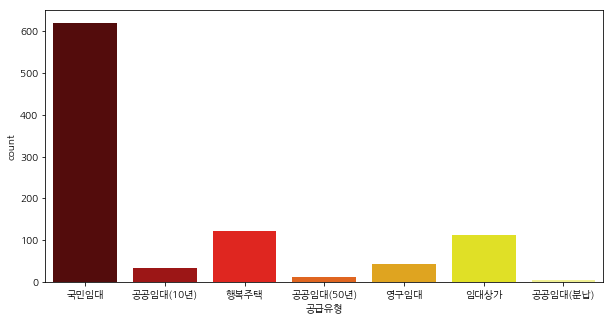

In [67]:
plt.subplots(figsize=(10,5))
sns.countplot(x=test["공급유형"],palette="hot")

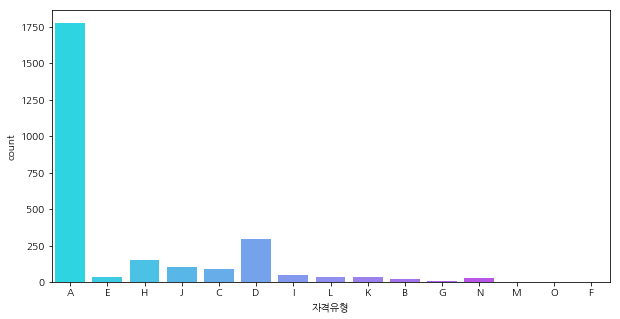

In [70]:
plt.subplots(figsize=(10,5))
sns.countplot(x=train["자격유형"],palette="cool")

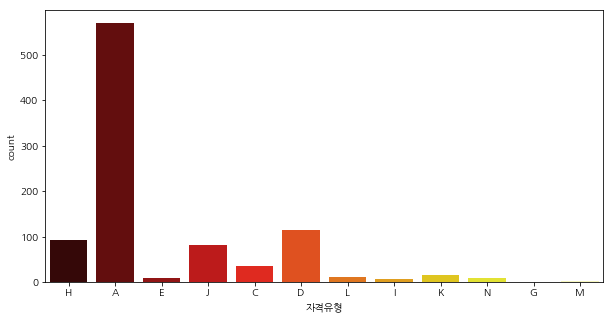

In [71]:
plt.subplots(figsize=(10,5))
sns.countplot(x=test["자격유형"],palette="hot")

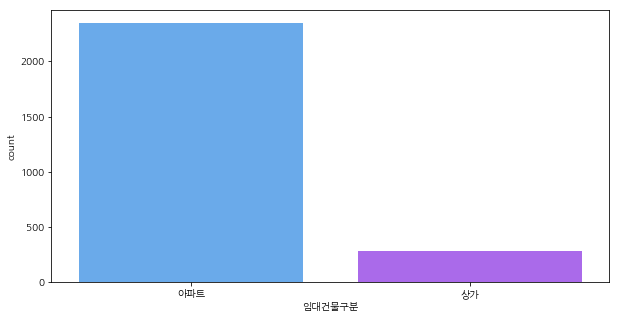

In [68]:
plt.subplots(figsize=(10,5))
sns.countplot(x=train["임대건물구분"],palette="cool")

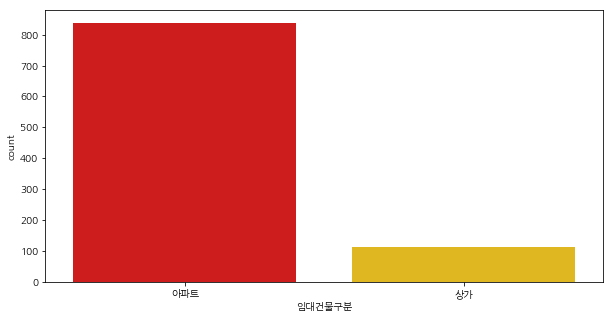

In [69]:
plt.subplots(figsize=(10,5))
sns.countplot(x=test["임대건물구분"],palette="hot")

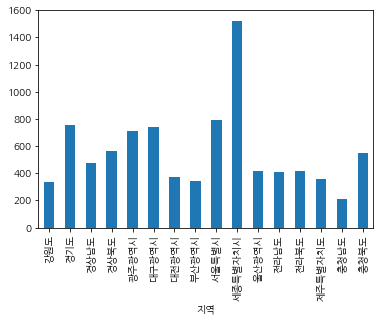

In [40]:
train['등록차량수'].groupby(train['지역']).median().plot.bar()

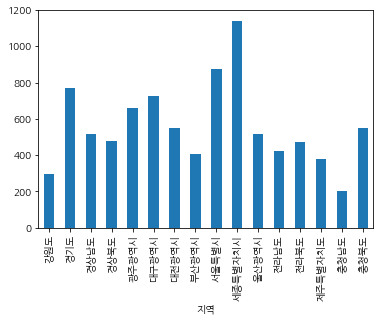

In [41]:
train['단지내주차면수'].groupby(train['지역']).median().plot.bar()

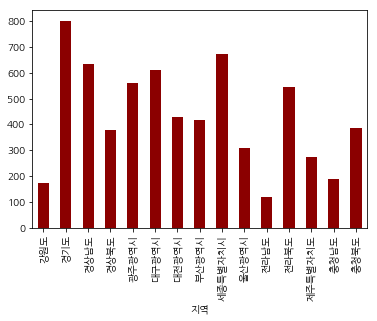

In [42]:
test['단지내주차면수'].groupby(test['지역']).median().plot.bar(color="darkred")

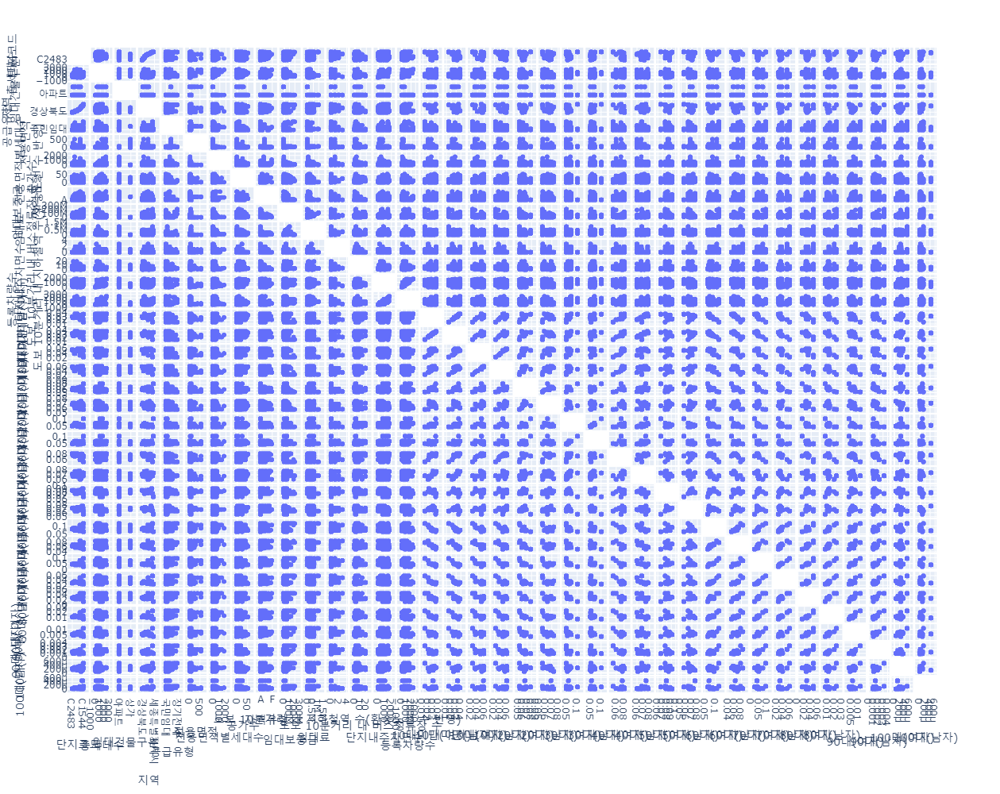

In [43]:
fig = px.scatter_matrix(train)
fig.update_layout(dragmode='select',
                  width=1000,
                  height=1000,
                  hovermode='closest')
fig.update_traces(diagonal_visible=False)
fig.show()

# 어림도 없지...

C:\Users\dbdms\Anaconda3\lib\site-packages\statsmodels\compat\pandas.py:49: FutureWarning:

The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version



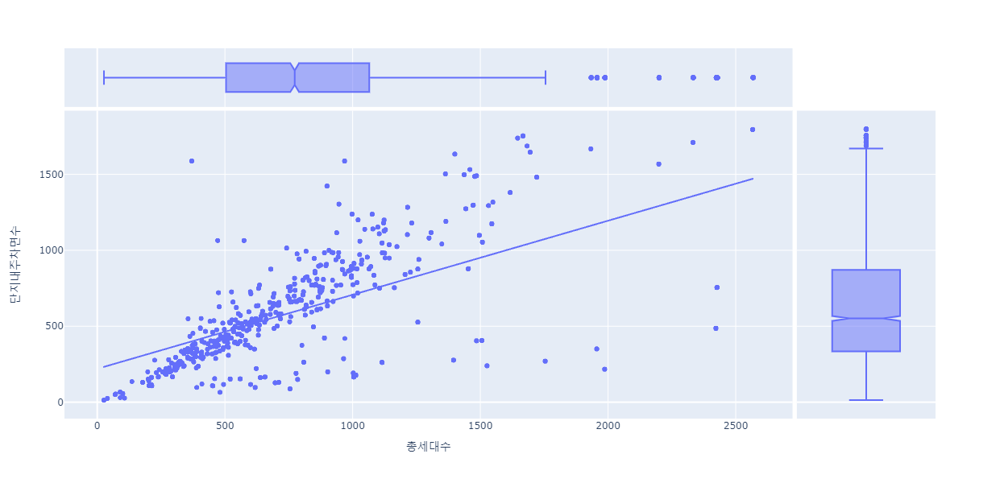

In [44]:
fig = px.scatter(train, x="총세대수", y="단지내주차면수", trendline="ols", hover_data=['단지코드'], marginal_x="box",marginal_y="box",)
fig.update_layout(width=600,
                  height=600,
                  hovermode='closest')
fig.show()

In [ ]:
fig = px.scatter(train, x="총세대수", y="단지내주차면수", trendline="ols", hover_data=['단지코드'], marginal_x="box",marginal_y="box",)
fig.update_layout(width=600,
                  height=600,
                  hovermode='closest')
fig.show()

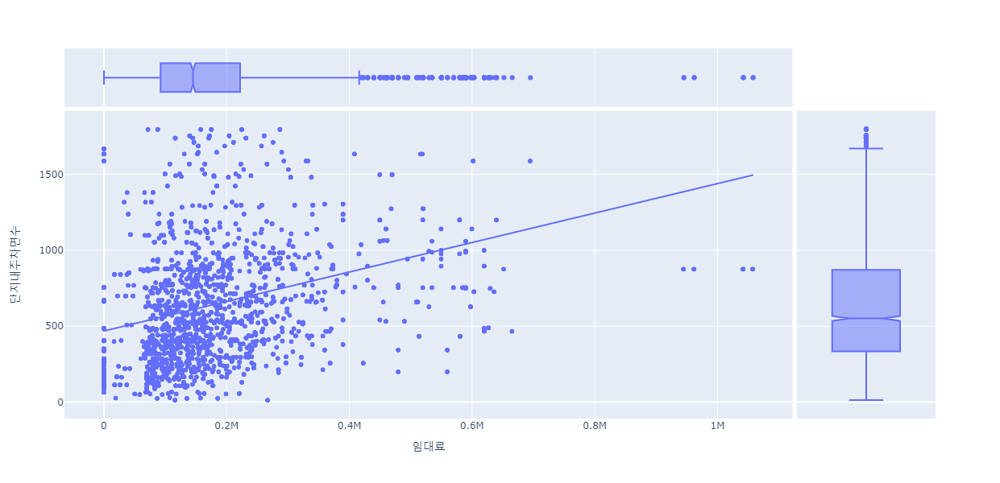

In [38]:
fig = px.scatter(train, x="임대료", y="단지내주차면수", trendline="ols", hover_data=['단지코드'], marginal_x="box",marginal_y="box",)
fig.update_layout(width=600,
                  height=600,
                  hovermode='closest')
fig.show()

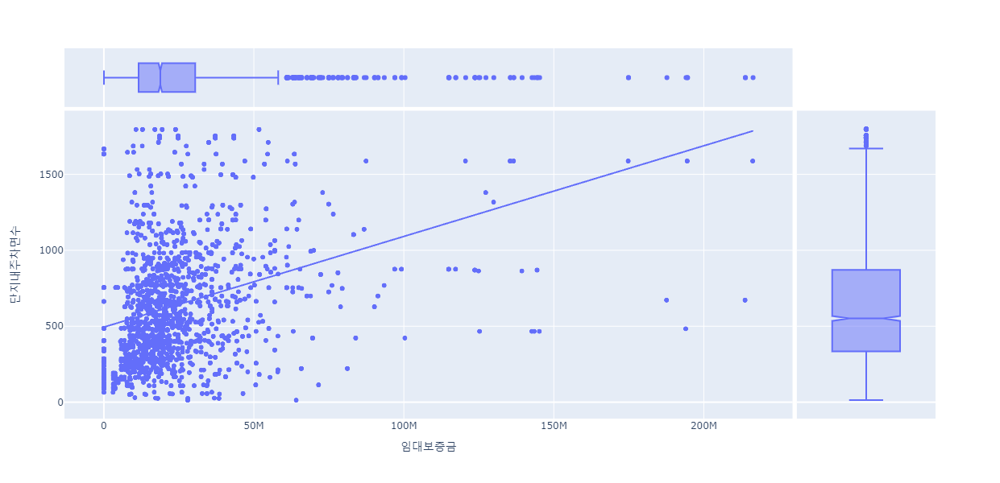

In [39]:
fig = px.scatter(train, x="임대보증금", y="단지내주차면수", trendline="ols", hover_data=['단지코드'], marginal_x="box",marginal_y="box",)
fig.update_layout(width=600,
                  height=600,
                  hovermode='closest')
fig.show()

# 저번에 회의한 내용

1. 임대상가, 공공분양 결측치 존재(임대보증금,임대료) --> imputation 방안 생각하기
(지역별 가중치, 예: 강원도같은 경우는 평균치를 넣고 서울은 이것의 1.5배로 설정)
2. 지하철역 na값있는 지역은 충청남도, 대전, 경상남도 --> 충청남도, 경상남도는 모두 0으로 채우고 대전은 생각해볼 것
3. 등록차량수/단지내주차면수 비율을 y값으로 예측하는 것도 하나의 방법

# 외부데이터

1) 도별 인구수
2) 도별 자동차 등록 수

In [50]:
car=pd.read_csv('인구수_자동차수.csv')
car.head()

,지역,남자인구수,여자인구수,승용차수
0,서울특별시,4654720,4920635,2711984
1,부산광역시,1648965,1718369,1189345
2,대구광역시,1184977,1217963,1027075
3,인천광역시,1470528,1465854,1426203
4,광주광역시,714101,729053,576366


## 데이터에 인천이 없네? test에는 서울이 없더니?

In [51]:
train=pd.merge(train, car, on='지역', how='outer')

In [52]:
test=pd.merge(test, car, on='지역', how='outer')

In [53]:
train.isna().sum()

단지코드                            1
총세대수                            1
임대건물구분                          1
지역                              0
공급유형                            1
전용면적                            1
전용면적별세대수                        1
공가수                             1
자격유형                            1
임대보증금                           1
임대료                             1
도보 10분거리 내 지하철역 수(환승노선 수 반영)    1
도보 10분거리 내 버스정류장 수              1
단지내주차면수                         1
등록차량수                           1
10대미만(여자)                       1
10대미만(남자)                       1
10대(여자)                         1
10대(남자)                         1
20대(여자)                         1
20대(남자)                         1
30대(여자)                         1
30대(남자)                         1
40대(여자)                         1
40대(남자)                         1
50대(여자)                         1
50대(남자)                         1
60대(여자)                         1
60대(남자)                         1
70대(여자)       

In [55]:
test.isna().sum()

단지코드                            2
총세대수                            2
임대건물구분                          2
지역                              0
공급유형                            2
전용면적                            2
전용면적별세대수                        2
공가수                             2
자격유형                            2
임대보증금                           2
임대료                             2
도보 10분거리 내 지하철역 수(환승노선 수 반영)    2
도보 10분거리 내 버스정류장 수              2
단지내주차면수                         2
10대미만(여자)                       2
10대미만(남자)                       2
10대(여자)                         2
10대(남자)                         2
20대(여자)                         2
20대(남자)                         2
30대(여자)                         2
30대(남자)                         2
40대(여자)                         2
40대(남자)                         2
50대(여자)                         2
50대(남자)                         2
60대(여자)                         2
60대(남자)                         2
70대(여자)                         2
70대(남자)       

In [56]:
train=train.dropna()
test=test.dropna()

In [57]:
corr = train.drop(['단지코드'],1,).corr()["등록차량수"].abs().sort_values(ascending=False)
corr

등록차량수                           1.000000
단지내주차면수                         0.851280
임대료                             0.461294
총세대수                            0.423656
임대보증금                           0.378680
30대(남자)                         0.336583
30대(여자)                         0.334040
50대(남자)                         0.286007
40대(남자)                         0.267028
여자인구수                           0.241435
남자인구수                           0.240277
50대(여자)                         0.218100
60대(남자)                         0.196288
10대미만(남자)                       0.194656
10대미만(여자)                       0.193385
전용면적별세대수                        0.188906
100대(여자)                        0.181658
80대(여자)                         0.173885
20대(남자)                         0.168742
60대(여자)                         0.118357
도보 10분거리 내 버스정류장 수              0.117849
70대(여자)                         0.114807
90대(여자)                         0.113862
40대(여자)                         0.101414
공가수             

In [58]:
corr = test.drop(['단지코드'],1,).corr()["단지내주차면수"].abs().sort_values(ascending=False)
corr

단지내주차면수                         1.000000
총세대수                            0.474501
임대료                             0.435611
여자인구수                           0.420603
남자인구수                           0.419346
임대보증금                           0.347923
전용면적별세대수                        0.312360
50대(남자)                         0.308356
공가수                             0.289616
30대(남자)                         0.268190
20대(남자)                         0.259886
30대(여자)                         0.258486
10대미만(여자)                       0.255967
40대(남자)                         0.250951
50대(여자)                         0.240983
10대미만(남자)                       0.230060
100대(남자)                        0.183699
도보 10분거리 내 버스정류장 수              0.159539
20대(여자)                         0.150411
90대(여자)                         0.147718
60대(남자)                         0.147482
40대(여자)                         0.143851
60대(여자)                         0.135113
100대(여자)                        0.125224
80대(여자)         

# 모델링

In [59]:
train.dtypes

단지코드                             object
총세대수                            float64
임대건물구분                           object
지역                               object
공급유형                             object
전용면적                            float64
전용면적별세대수                        float64
공가수                             float64
자격유형                             object
임대보증금                           float64
임대료                             float64
도보 10분거리 내 지하철역 수(환승노선 수 반영)    float64
도보 10분거리 내 버스정류장 수              float64
단지내주차면수                         float64
등록차량수                           float64
10대미만(여자)                       float64
10대미만(남자)                       float64
10대(여자)                         float64
10대(남자)                         float64
20대(여자)                         float64
20대(남자)                         float64
30대(여자)                         float64
30대(남자)                         float64
40대(여자)                         float64
40대(남자)                         float64


In [75]:
from sklearn.metrics import mean_absolute_error
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
#mean_absolute_error(y_test, y_pred)

In [81]:
X = train.drop(columns='등록차량수')
y = train[['등록차량수']]

In [82]:
X = pd.get_dummies(X, drop_first=True)

In [83]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, shuffle=True, random_state=2021)

In [84]:
rf = RandomForestRegressor(random_state=2021).fit(X_train, y_train)
rf_pred = rf.predict(X_test)

C:\Users\dbdms\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



In [85]:
mean_absolute_error(y_test, rf_pred)

21.602164556962023

In [86]:
gb = GradientBoostingRegressor(random_state=2021).fit(X_train, y_train)
gb_pred = gb.predict(X_test)

C:\Users\dbdms\Anaconda3\lib\site-packages\sklearn\utils\validation.py:73: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



In [87]:
mean_absolute_error(y_test, gb_pred)

85.12426154079682

In [91]:
print(train.shape)
print(test.shape)

(2632, 40)
(949, 39)


In [104]:
train

,단지코드,총세대수,임대건물구분,지역,공급유형,전용면적,전용면적별세대수,공가수,자격유형,임대보증금,...,70대(남자),80대(여자),80대(남자),90대(여자),90대(남자),100대(여자),100대(남자),남자인구수,여자인구수,승용차수
0,C2483,900.0,아파트,경상북도,국민임대,39.72,134.0,38.0,A,15667000.0,...,0.030172,0.029361,0.011211,0.005578,0.001553,0.000234,0.000014,1327307,1306285,1098846
1,C2483,900.0,아파트,경상북도,국민임대,39.72,15.0,38.0,A,15667000.0,...,0.030172,0.029361,0.011211,0.005578,0.001553,0.000234,0.000014,1327307,1306285,1098846
2,C2483,900.0,아파트,경상북도,국민임대,51.93,385.0,38.0,A,27304000.0,...,0.030172,0.029361,0.011211,0.005578,0.001553,0.000234,0.000014,1327307,1306285,1098846
3,C2483,900.0,아파트,경상북도,국민임대,51.93,15.0,38.0,A,27304000.0,...,0.030172,0.029361,0.011211,0.005578,0.001553,0.000234,0.000014,1327307,1306285,1098846
4,C2483,900.0,아파트,경상북도,국민임대,51.93,41.0,38.0,A,27304000.0,...,0.030172,0.029361,0.011211,0.005578,0.001553,0.000234,0.000014,1327307,1306285,1098846
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2627,C2086,1080.0,아파트,세종특별자치시,공공임대(10년),59.94,30.0,7.0,A,39000000.0,...,0.026223,0.013893,0.007086,0.003459,0.001004,0.000279,0.000112,180778,181258,4966689
2628,C2086,1080.0,아파트,세종특별자치시,공공임대(10년),74.92,156.0,7.0,A,49000000.0,...,0.026223,0.013893,0.007086,0.003459,0.001004,0.000279,0.000112,180778,181258,4966689
2629,C2086,1080.0,아파트,세종특별자치시,공공임대(10년),74.93,78.0,7.0,A,49000000.0,...,0.026223,0.013893,0.007086,0.003459,0.001004,0.000279,0.000112,180778,181258,4966689
2630,C2086,1080.0,아파트,세종특별자치시,공공임대(10년),84.88,160.0,7.0,A,61000000.0,...,0.026223,0.013893,0.007086,0.003459,0.001004,0.000279,0.000112,180778,181258,4966689


In [93]:
df= pd.concat([train, test])

In [95]:
X = df.drop(columns='등록차량수')

In [96]:
X= pd.get_dummies(X, drop_first=True)

In [105]:
X.train=X.iloc[0:2632, :]

C:\Users\dbdms\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: UserWarning:

Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access



In [109]:
X.test=X.iloc[2632:, :]

C:\Users\dbdms\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: UserWarning:

Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access



In [94]:
y_train = train[['등록차량수']]

In [110]:
rf = RandomForestRegressor(random_state=2021).fit(X.train, y_train)
rf_pred = rf.predict(X.test)

C:\Users\dbdms\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



In [111]:
rf_pred

array([ 688.55,  695.97,  684.52,  684.52,  685.2 ,  684.27,  692.66,
        693.83,  994.02,  995.59,  993.64,  994.08,  996.04,  993.02,
        992.96,  986.99,  990.17, 1026.56, 1028.54, 1033.41, 1033.41,
       1029.82, 1033.41, 1031.68, 1033.64, 1597.39, 1597.39, 1596.37,
       1599.33, 1599.33, 1599.33, 1599.33, 1599.33, 1598.31, 1599.33,
       1599.33,  605.07,  613.08,  614.5 ,  613.08,  621.54,  621.54,
        798.14,  794.5 ,  799.3 ,  812.36,  812.36,  812.18,  818.93,
        818.93,  582.03,  586.15,  586.88,  586.88,  581.38,  585.19,
        590.72,  806.19,  806.25,  806.25,  807.22,  807.22,  807.93,
        804.41,  804.41,  809.27,  782.59,  775.26,  795.38,  795.96,
        795.96,  795.96,  797.86,  798.44,  798.12,  955.12,  961.13,
        961.13,  961.13,  961.7 ,  961.13,  956.88,  957.72,  389.68,
        400.21,  400.2 ,  400.21,  400.2 ,  423.48,  546.92,  546.42,
        545.12,  953.77,  955.63,  949.07,  957.07,  960.54,  962.75,
        962.75,  964

In [117]:
code=test.단지코드

In [119]:
rf_p=pd.DataFrame(rf_pred)

In [120]:
pred=pd.concat([code, rf_p], axis=1)

,단지코드,0
0,C1072,688.55
1,C1072,695.97
2,C1072,684.52
3,C1072,684.52
4,C1072,685.20
...,...,...
944,C1229,293.36
945,C1229,293.36
946,C1229,292.72
947,C1229,292.11


In [121]:
pred=pd.concat([code, rf_p], axis=1)

In [134]:
pred.columns=["code", "Y"]

In [136]:
pred_mean=pred.Y.groupby(pred.code).mean()

In [137]:
pred_mean

code
C1003     267.506250
C1006     205.785263
C1016     735.765000
C1019     317.785000
C1030      26.230000
            ...     
C2653     829.582500
C2675    1130.723750
C2676     161.899333
C2688      80.955000
C2691    1233.600000
Name: Y, Length: 150, dtype: float64

In [131]:
pred_mean=pd.DataFrame(pred_mean)

In [129]:
sample=pd.read_csv('sample_submission.csv')
sample.head()

,code,num
0,C1072,0
1,C1128,0
2,C1456,0
3,C1840,0
4,C1332,0


In [140]:
sample.shape

(150, 2)

In [138]:
test=pd.merge(sample, pred_mean, on='code', how='outer')

In [139]:
test= test.drop

,code,num,Y
0,C1072,0,688.690000
1,C1128,0,992.945556
2,C1456,0,533.426250
3,C1840,0,488.305000
4,C1332,0,1031.308750
...,...,...,...
145,C2456,0,283.415000
146,C1266,0,526.702000
147,C2152,0,46.965000
148,C1267,0,418.908182


In [141]:
test= test.drop(columns='num')

In [143]:
test.columns=["code", "num"]

In [144]:
test

,code,num
0,C1072,688.690000
1,C1128,992.945556
2,C1456,533.426250
3,C1840,488.305000
4,C1332,1031.308750
...,...,...
145,C2456,283.415000
146,C1266,526.702000
147,C2152,46.965000
148,C1267,418.908182


In [146]:
test.to_csv('test.csv', index=False)

In [159]:
rf_feature=pd.Series(rf.feature_importances_,X.train.columns).sort_values(ascending=True)

In [160]:
rf_feature[620:]

100대(남자)              0.001498
10대미만(여자)             0.001520
단지코드_C1722            0.001523
승용차수                  0.001584
70대(여자)               0.001745
40대(여자)               0.001751
50대(여자)               0.001764
50대(남자)               0.001921
단지코드_C1244            0.002215
임대보증금                 0.002315
70대(남자)               0.002613
단지코드_C1032            0.003522
30대(남자)               0.003649
40대(남자)               0.003770
전용면적                  0.003806
단지코드_C2362            0.003971
80대(남자)               0.004249
단지코드_C1013            0.004434
30대(여자)               0.004963
임대료                   0.007483
도보 10분거리 내 버스정류장 수    0.012248
총세대수                  0.032395
공급유형_공공임대(10년)        0.034262
공가수                   0.068450
단지내주차면수               0.745854
dtype: float64

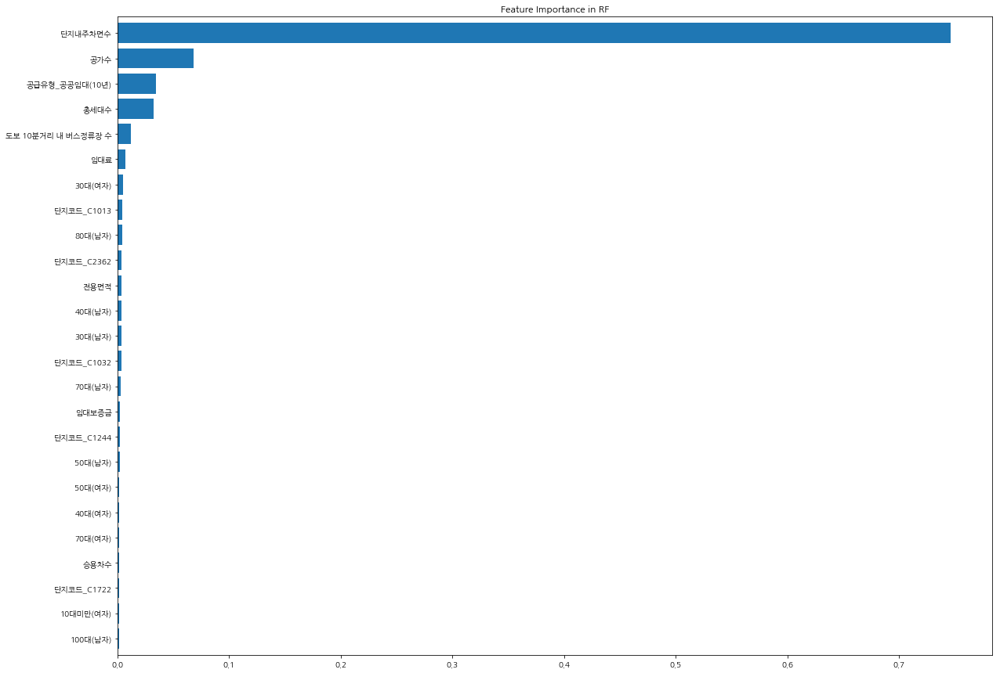

In [162]:
plt.figure(figsize=(20,15))
rf_feature[620:].plot.barh(width=0.8).set_title('Feature Importance in RF')
plt.show()

In [3]:
test=pd.read_csv('test.csv')
test.head()

,단지코드,총세대수,임대건물구분,지역,공급유형,전용면적,전용면적별세대수,공가수,자격유형,임대보증금,임대료,도보 10분거리 내 지하철역 수(환승노선 수 반영),도보 10분거리 내 버스정류장 수,단지내주차면수
0,C1072,754,아파트,경기도,국민임대,39.79,116,14.0,H,22830000,189840,0.0,2.0,683.0
1,C1072,754,아파트,경기도,국민임대,46.81,30,14.0,A,36048000,249930,0.0,2.0,683.0
2,C1072,754,아파트,경기도,국민임대,46.90,112,14.0,H,36048000,249930,0.0,2.0,683.0
3,C1072,754,아파트,경기도,국민임대,46.90,120,14.0,H,36048000,249930,0.0,2.0,683.0
4,C1072,754,아파트,경기도,국민임대,51.46,60,14.0,H,43497000,296780,0.0,2.0,683.0


In [7]:
test[test.임대건물구분=="상가"]

,단지코드,총세대수,임대건물구분,지역,공급유형,전용면적,전용면적별세대수,공가수,자격유형,임대보증금,임대료,도보 10분거리 내 지하철역 수(환승노선 수 반영),도보 10분거리 내 버스정류장 수,단지내주차면수
80,C1006,1505,상가,대전광역시,임대상가,38.00,1,27.0,D,NaN,NaN,2.0,5.0,428.0
81,C1006,1505,상가,대전광역시,임대상가,38.00,1,27.0,D,NaN,NaN,2.0,5.0,428.0
82,C1006,1505,상가,대전광역시,임대상가,37.26,1,27.0,D,NaN,NaN,2.0,5.0,428.0
83,C1006,1505,상가,대전광역시,임대상가,37.41,1,27.0,D,NaN,NaN,2.0,5.0,428.0
84,C1006,1505,상가,대전광역시,임대상가,37.41,1,27.0,D,NaN,NaN,2.0,5.0,428.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
328,C1729,627,상가,강원도,임대상가,32.46,1,0.0,D,NaN,NaN,0.0,5.0,131.0
329,C1729,627,상가,강원도,임대상가,34.86,1,0.0,D,NaN,NaN,0.0,5.0,131.0
330,C1729,627,상가,강원도,임대상가,35.76,1,0.0,D,NaN,NaN,0.0,5.0,131.0
331,C1729,627,상가,강원도,임대상가,50.08,1,0.0,D,NaN,NaN,0.0,5.0,131.0


In [9]:
test[test.단지코드=="C1729"]

,단지코드,총세대수,임대건물구분,지역,공급유형,전용면적,전용면적별세대수,공가수,자격유형,임대보증금,임대료,도보 10분거리 내 지하철역 수(환승노선 수 반영),도보 10분거리 내 버스정류장 수,단지내주차면수
308,C1729,627,아파트,강원도,영구임대,32.76,180,0.0,C,5009000,93000,0.0,5.0,131.0
309,C1729,627,아파트,강원도,영구임대,32.76,64,0.0,C,5009000,93000,0.0,5.0,131.0
310,C1729,627,아파트,강원도,영구임대,32.76,27,0.0,C,5009000,93000,0.0,5.0,131.0
311,C1729,627,아파트,강원도,영구임대,32.76,44,0.0,C,5009000,93000,0.0,5.0,131.0
312,C1729,627,아파트,강원도,영구임대,42.48,180,0.0,C,6496000,120600,0.0,5.0,131.0
313,C1729,627,아파트,강원도,영구임대,42.48,56,0.0,C,6496000,120600,0.0,5.0,131.0
314,C1729,627,아파트,강원도,영구임대,42.48,23,0.0,C,6496000,120600,0.0,5.0,131.0
315,C1729,627,아파트,강원도,영구임대,42.48,36,0.0,C,6496000,120600,0.0,5.0,131.0
316,C1729,627,상가,강원도,임대상가,13.02,1,0.0,D,NaN,NaN,0.0,5.0,131.0
317,C1729,627,상가,강원도,임대상가,18.54,1,0.0,D,NaN,NaN,0.0,5.0,131.0
